### **Auteurs** :
- MENDJEL Nacira
- NKIMO LENOU Randolf




 # **Introduction**
Dans l'industrie de la construction et de la décoration, le bois est un matériau précieux utilisé pour ses qualités esthétiques et structurelles. Cependant, la présence de nœuds, vestiges de branches dans l'arbre vivant, peut representer un défi dans l'utilisation du bois. Ces nœuds peuvent être un atout, ajoutant un caratère et de la beauté à la pièce, soit un inconvenient affectant la résistance ou l'aspect final du matériau.

Le projet s'attache à résoudre cette problématique en développant un programme python dédié à **`l'identification précice des nœuds`** dans des échantillons de bois. L'objectif fondamental est de créer une méthode automatisée permettant de détecter et de localiser avec précision les nœuds, tout en déterminant leur taille relative dans le bois.

La structure du projet est décomposée en plusieurs sections distinctes. Dans la première partie, nous mettons en œuvre une méthode initiale de détection des nœuds et procédons à une analyse des résultats obtenus sur le jeu de données fourni. Cette analyse est suivie d'une identification des limitations de cette méthode. En réponse à ces limites, nous proposons des améliorations spécifiques, notamment en rendant la détection plus objective par l'automatisation du seuil et de la surface minimale des nœuds, en prenant en compte les caractéristiques propres à chaque image. Une discussion approfondie des résultats obtenus est ensuite conduite. En complément, une transformation d'histogramme est appliquée pour mettre en évidence les zones sombres de l'image, correspondant aux nœuds, dans le but d'améliorer la précision de la détection.

In [9]:
# Indiquer l'emplacement de vos données dans la variable Path suivante
Path = "Data"

In [10]:
import skimage.io as io
import matplotlib.pyplot as plt
import skimage
import numpy as np
import skimage.color as clr
from skimage.morphology import square, closing, erosion, opening, disk, dilation, rectangle, opening
import glob
from scipy.ndimage import binary_fill_holes
import matplotlib.patches as mpatches
from skimage.filters import threshold_otsu, threshold_multiotsu
from skimage.exposure import equalize_hist
import os

In [11]:
Liste_noms = glob.glob(f'{Path}/*.jpg')

# **Implémentation de la première méthode**

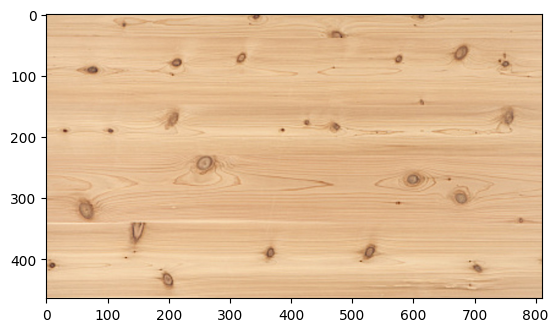

In [12]:
#Lecture de l'image
image = io.imread(Liste_noms[4])
plt.imshow(image, cmap='gray')

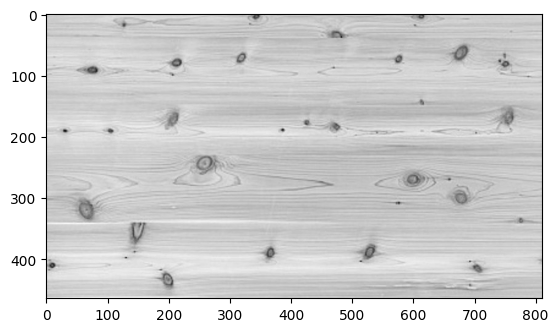

In [13]:
# Conversion de l'image en niveau de gris
gray_image = clr.rgb2gray(image)
plt.imshow(gray_image, cmap='gray')

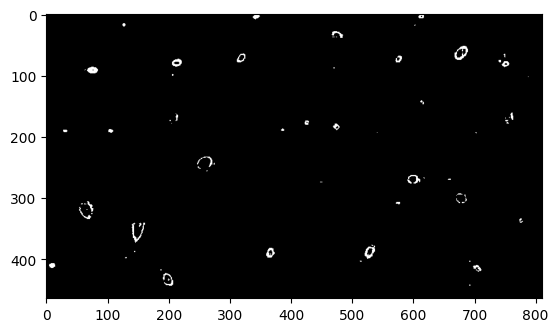

In [ ]:
# Pour déterminer les pixels foncés de l'image on applique un seuillage avec un seuil fixé à valeur maximale de l'intensité/ 2
T = gray_image.max()/2
image_thresholded = gray_image < 0.5
plt.imshow(image_thresholded, cmap='gray')

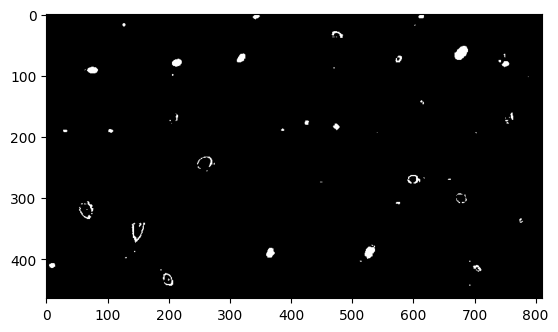

In [ ]:
# Remplissage des trous par la fonction binary_fill_holes
image_t_filled =   binary_fill_holes(image_thresholded)
plt.imshow(image_t_filled, cmap='gray')

In [ ]:
# On étiquette l'image, ce qui revient à dire que pour chaque région détectée (région en blanc), on lui affecte un label (un chiffre).
# Les propriétés de chaque région détectée (aire, coordonnées des centroides, etc.) sont enregistrées dans la variable region.
label_image = skimage.measure.label(image_t_filled)
regions = skimage.measure.regionprops(label_image)

In [ ]:
# Dans filtered_regions, on ne garde que les régions dont l'aire est supérieure à 5 pixels et dont l'excentricité est inférieure à 0,9.
filtered_regions = [region for region in regions if  (region.area > 5) & (region.eccentricity < 0.9)]

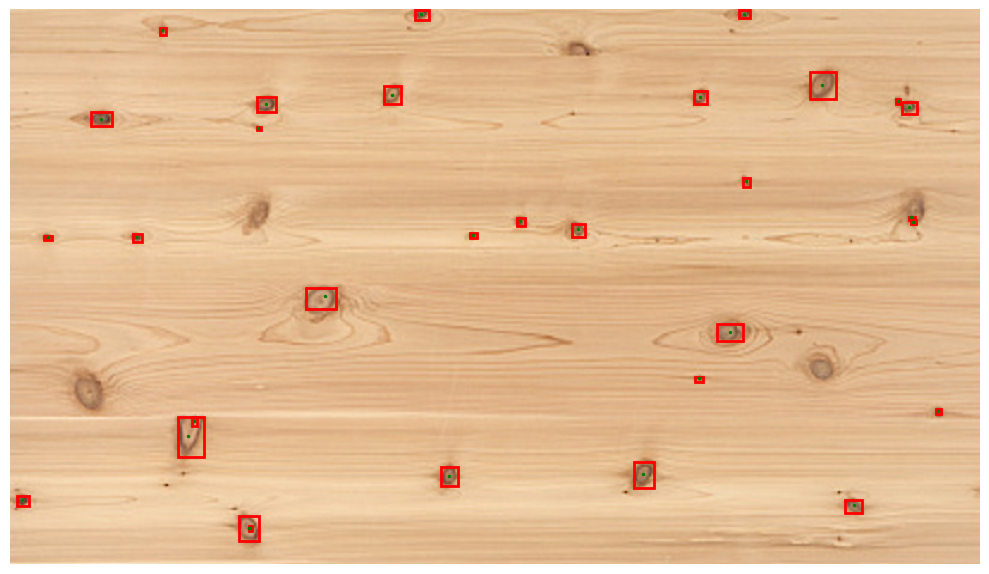

In [ ]:
# À l'aide de ce code, on affiche l'image originale en encadrant les noeuds détectés avec des rectangles.
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image, cmap= 'gray')

for region in filtered_regions:

    min_row, min_colon, max_row, max_colon = region.bbox
    rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                    fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)
    ax.plot()
    y0, x0 = region.centroid
    ax.plot(x0, y0, '.g', markersize=3)

ax.set_axis_off()
plt.tight_layout()
plt.show()

**Ecriture de la première méthode en une fonction**

In [ ]:
def methode_base (image):
  #nom_fichier = f'{g}\D_EST_{s}_{t}_{g}_{lenW}.npy'
  path_image = os.path.join(Path,image)
  image = io.imread( path_image)
  gray_image = clr.rgb2gray(image)
  T = gray_image.max()/2
  image_thresholded = gray_image < 0.5
  image_t_filled =   binary_fill_holes(image_thresholded)
  label_image = skimage.measure.label(image_t_filled)
  regions = skimage.measure.regionprops(label_image)
  filtered_regions = [region for region in regions if  (region.area > 5) & (region.eccentricity < 0.9)]
  # À l'aide de ce code, on affiche l'image originale en encadrant les noeuds détectés avec des rectangles.
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.imshow(image, cmap= 'gray')

  for region in filtered_regions:

      min_row, min_colon, max_row, max_colon = region.bbox
      rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                      fill=False, edgecolor='red', linewidth=2)
      ax.add_patch(rect)
      ax.plot()
      y0, x0 = region.centroid
      ax.plot(x0, y0, '.g', markersize=3)

  ax.set_axis_off()
  plt.tight_layout()
  plt.show()

# **Discusion des résultats de la première méthode**
* La méthode proposée fonctionne plutôt bien sur une partie des images données. On obtient de bonnes détections, même si quelques noeuds restent tout de même non détectés.

* Dans certaines images, il y a énormément de fausses détections, c'est le cas par exemple des images où il y a la présence de grands noeuds avec beaucoup de veines (exemple de l'image suivante). Dans d'autres images, on ne retrouve aucune détection.



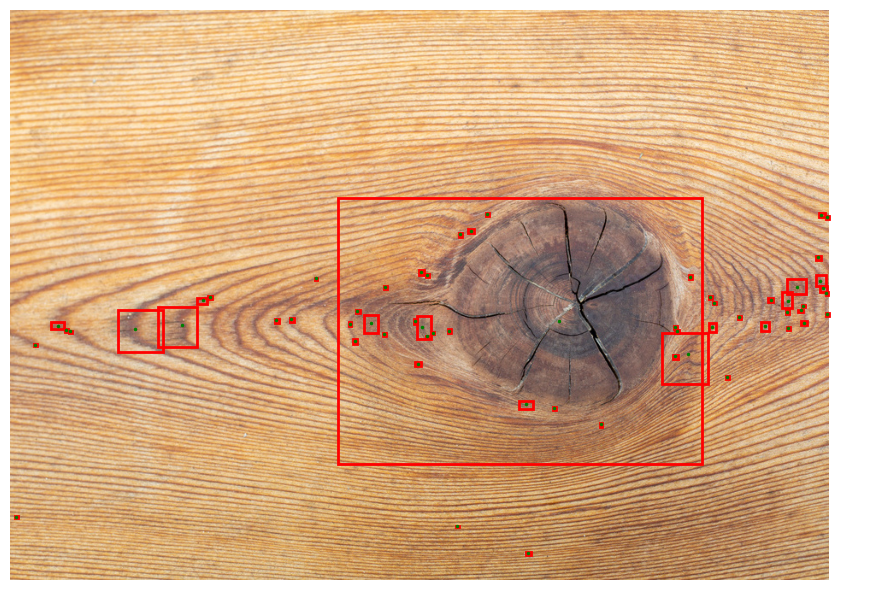

In [ ]:
methode_base('298365657.jpg')

* En délimitant les noeuds détectés par des rectangles, on constate que la taille de nombreux noeuds détectés ne correspond pas à leur taille réelle.

* Dans cette méthode, on s'appuie sur une caractéristique des noeuds, à savoir qu'ils sont généralement les zones les plus sombres d'une image. Cependant, dans certaines images où le fond est également sombre, la méthode peut échouer et ne pas détecter les noeuds, car elle ne peut pas faire la distinction entre les noeuds et le fond. De plus, cette caractéristique d'intensité est certes vérifiée dans la plupart des images, mais il reste que dans certaines images, les noeuds ne peuvent pas être distingués par leur intensité uniquement. C'est le cas d'une image du dataset, où l'on peut distinguer les contours du noeud uniquement par ses bords, mais l'intérieur du noeud a la même intensité que le fond de l'image (image suivante). Dans cette image, on trouve même des parties du fond de l'image plus foncées que le noeud.



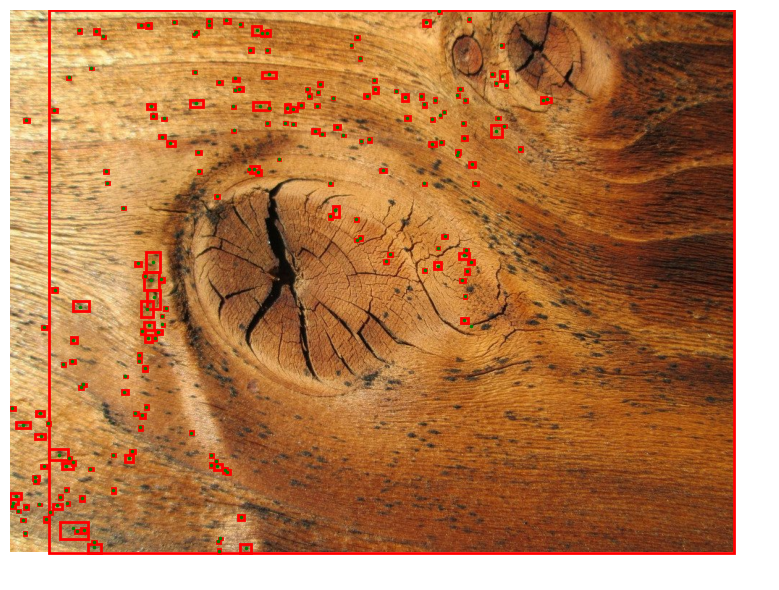

In [ ]:
methode_base('996511289663.jpg')

* Lorsque des veines sont présentes à proximité des noeuds (en particulier dans les images avec de grands noeuds), la méthode échoue, car ces veines sont également sombres et sont détectées comme de petits noeuds (ce qui entraîne de nombreuses fausses détections).

* Un autre problème de cette méthode est qu'elle nécessite un réglage manuel de certains paramètres, ce qui la rend moins automatique et peut entraîner des erreurs. La valeur du seuil est fixée pour toutes les images, ce qui ne reflète pas toujours les informations contenues dans chaque image. En effet, il existe des images où toutes les intensités sont du même ordre, par exemple, toutes les intensités sont claires, avec un histogramme étroit vers les grandes intensités. Dans ce cas, un seuil de 0,5 éliminera même les noeuds lors du seuillage.  La surface minimale du noeud à accepter est également fixée dès le début sans avoir aucune information sur l'image et le type des noeuds, ce qui entraîne de nombreuses fausses détections, en particulier en présence de grands noeuds.

# Apport d'améliorations à la méthode 1

# Automatisation de la méthode 1

La première chose qu'on propose de faire est déjà d'automatiser la première méthode. En premier lieu, au lieu de fixer la valeur du seuil et de la surface minimale à prendre pour noeud, on les met en place en s'appuyant sur les informations spécifiques à chaque image.

* Pour le seuil, on va utiliser **la méthode d'Otsu**. Cette méthode dépend de chaque image, car son principe est de maximiser la variance interclasse en utilisant l'histogramme de l'image. De plus, c'est la méthode qui est utilisée très couramment dans la littérature dans ce type de problématique [1],[2].

* Pour la surface minimale à prendre en compte, on va la fixer en se basant sur une remarque établie. En effet, dans une image, les noeuds sont généralement tous du même ordre de taille. Par exemple, si on est en présence d'un très grand noeud, les autres noeuds qui seront présents dans l'image seront plutôt soit de même taille, soit petits d'un certain pourcentage du grand noeud.  Cette information de proportionnalité des tailles des noeuds peut être considérée comme un a priori qu'on fixera selon l'image à traiter. Dans ce qui suit, on va supposer que le plus petit noeud à détecter est de taille minimale égale à **5 %** de la taille du plus grand noeud.

In [ ]:
# Chargement et conversion en niveau de gris de l'image
image = io.imread(Liste_noms[0])
gray_image = clr.rgb2gray(image)

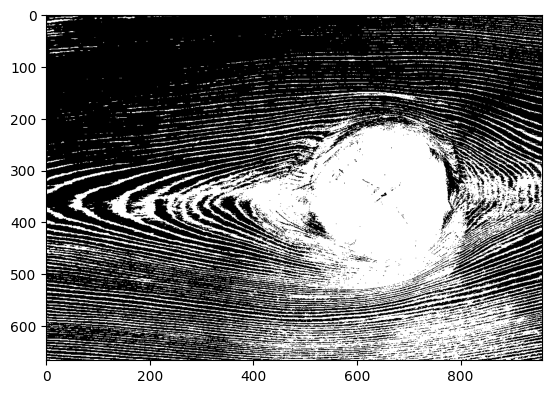

In [ ]:
# Calcule du seuil par la méthode d'Otsu et seuillage de l'image
T_otsu = threshold_otsu(gray_image)
image_thresholded_Otsu = gray_image < T_otsu
plt.imshow(image_thresholded_Otsu, cmap='gray')

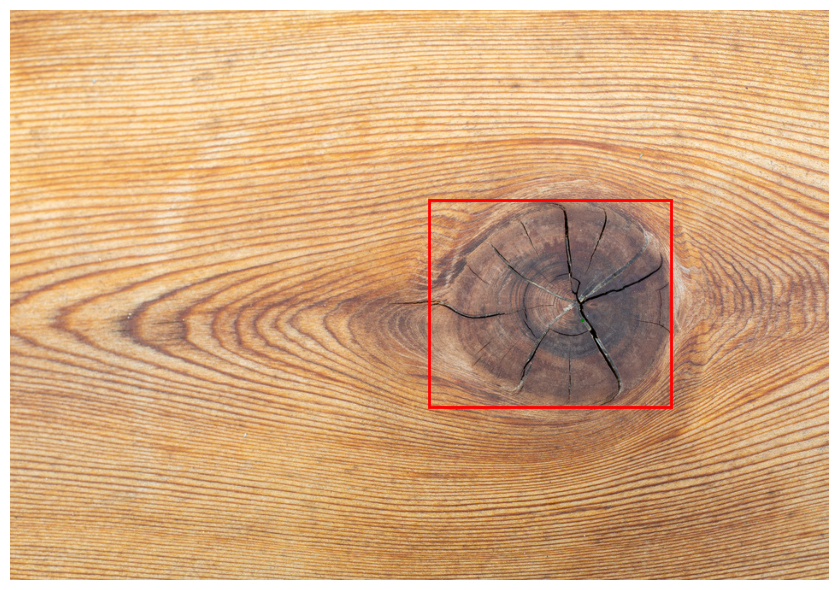

In [ ]:
image_t_filled =   binary_fill_holes(image_thresholded_Otsu)
label_image1 = skimage.measure.label(image_t_filled )
regions1 = skimage.measure.regionprops(label_image1)

# On récupère les aires des régions dont l'excentricité est inférieure à 0,9, pour qu'ensuite trouver l'aire maximale .
Aires = [ region.area for region in regions1 if (region.eccentricity < 0.9)]
max_aire = np.max(Aires)
filtered_regions3 = [region for region in regions1 if  (region.area_filled > 0.05*max_aire) & (region.eccentricity < 0.9)]
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image, cmap= 'gray')

for region in filtered_regions3:

    min_row, min_colon, max_row, max_colon = region.bbox
    rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                    fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)
    ax.plot()
    y0, x0 = region.centroid
    ax.plot(x0, y0, '.g', markersize=3)

ax.set_axis_off()
plt.tight_layout()
plt.show()

In [ ]:
def methode_auto(image):
  #nom_fichier = f'{g}\D_EST_{s}_{t}_{g}_{lenW}.npy'
  path_image = os.path.join(Path,image)
  image = io.imread( path_image)
  gray_image = clr.rgb2gray(image)
  T_otsu = threshold_otsu(gray_image)
  image_thresholded_Otsu = gray_image < T_otsu
  label_image = skimage.measure.label(image_thresholded_Otsu)
  regions = skimage.measure.regionprops(label_image)
  filtered_regions = [region for region in regions if  (region.area > 5) & (region.eccentricity < 0.9)]
  # À l'aide de ce code, on affiche l'image originale en encadrant les noeuds détectés avec des rectangles.
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.imshow(image, cmap= 'gray')
  for region in filtered_regions:

      min_row, min_colon, max_row, max_colon = region.bbox
      rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                      fill=False, edgecolor='red', linewidth=2)
      ax.add_patch(rect)
      ax.plot()
      y0, x0 = region.centroid
      ax.plot(x0, y0, '.g', markersize=3)

  ax.set_axis_off()
  plt.tight_layout()
  plt.show()


# **Discussion des résultats de ces améliorations apportées**



Ces deux changements que nous avons apportés améliorent la détection dans certaines images (nous arrivons à détecter plus de noeuds), et éliminent le nombre énorme de fausses détections dans les images de grands noeuds. Cependant, dans quelques images, nous perdons quelques détections que nous avions pu avoir en utilisant la première méthode, c'est par exemple le cas de l'image `1585267079207.jpg`.



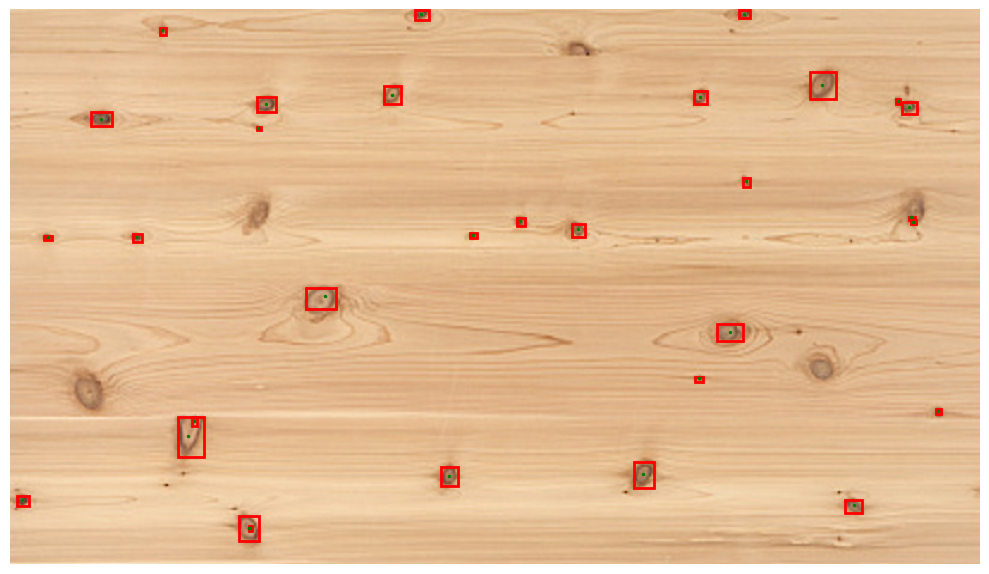

In [ ]:
methode_base('1585267079207.jpg')

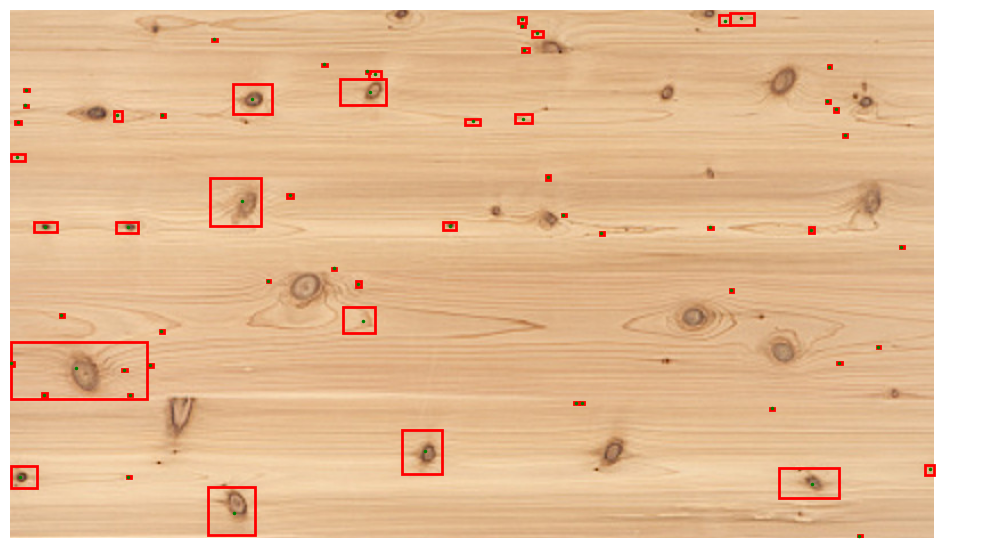

In [ ]:
methode_auto('1585267079207.jpg')

Aussi, certes nous avons réduit le nombre de fausses détections, mais la précision sur la taille des noeuds détectés est détériorée, voire très mauvaise (Noeud dans les images `298365657.jpg`,`1597697129310.jpg`).Ce problème est dû au fait que le seuil détecté par la méthode d'Otsu n'est pas adapté. Les parties sombres aux alentours des noeuds sont également classées dans la catégorie des noeuds. Leurs pixels sont ajoutés à ceux des noeuds, ce qui donne des noeuds de surface très grande qui ne reflètent pas la réalité.



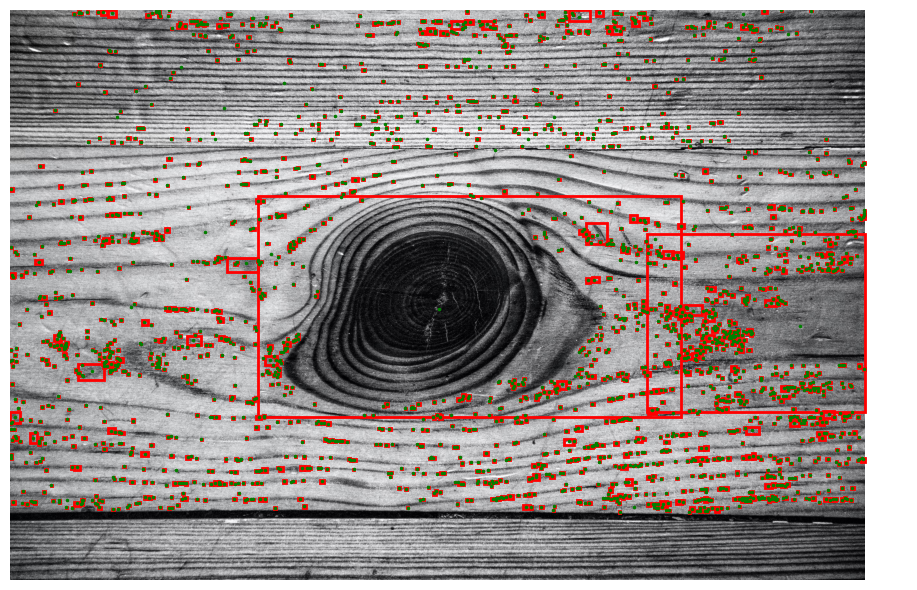

In [ ]:
methode_auto('1597697129310.jpg')

Il faut donc envisager une modification de la méthode d'Otsu afin de permettre une distinction plus précise entre les nœuds et les zones sombres environnantes. Une approche consiste à ajuster l'intensité de l'image, en réalisant une **transformation d'intensité** spécifique. En optant pour des transformations d'intensité particulières, il est possible de mettre en relief la différence de teinte entre les nœuds et le reste de l'image. Cette démarche pourrait améliorer le positionnement du seuil, facilitant ainsi la distinction des nœuds par rapport aux autres parties de l'image.

La première transformation à laquelle nous avons penser est **la transformation gamma**. En effet, avec une puissance appropriée, nous pouvons étaler les valeurs des zones sombres et contracter les valeurs des zones claires. De cette manière, la plupart des pixels seront clairs et seuls les pixels des noeuds seront sombres (quand on parle de sombre ici c'est relatif, puisque avec un coefficent Gamma trés inférieur à 1 toutes les intensités seront grandes). En effet une transformation gamma avec un coefficient inférieur à 1 a pour effet de réduire le contraste d'une image. Cela se traduit par un effet de lissage de l'image. Les détails fins seront moins visibles, et l'image aura un aspect plus uniforme.
Avant d'appliquer cette transformation, on applique la fonction `equalize_hist()`pour égaliser l'histogramme de l'image originalle. Cela garantit que la correction gamma affecte tous les pixels de l'image de manière uniforme.

# Transformation d'Histogramme

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


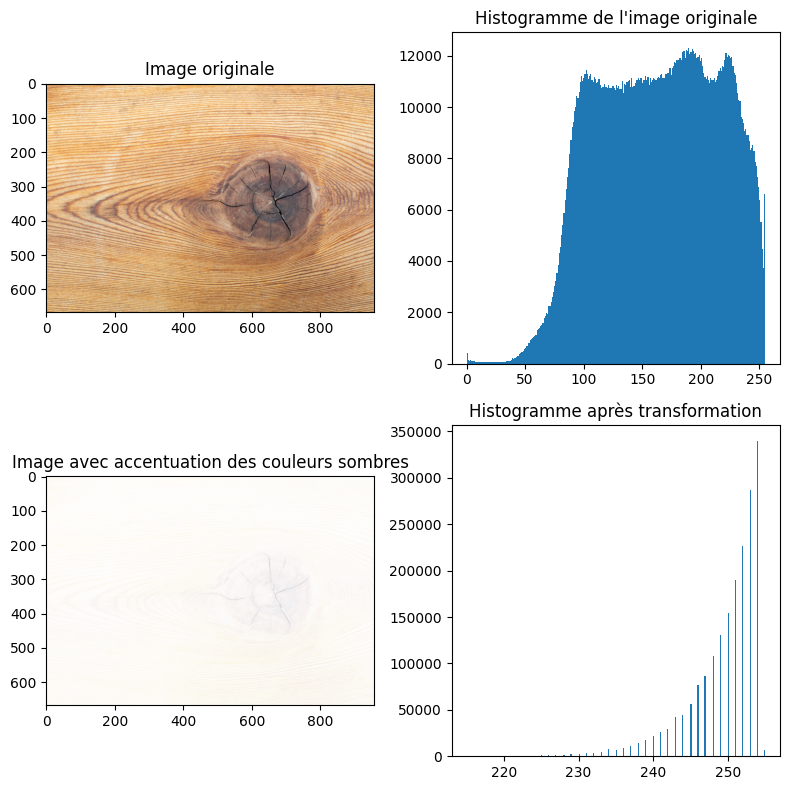

In [ ]:
image = io.imread(Liste_noms[0])
image1 = equalize_hist(image)*255
image1 = image1.astype(float)
# Application de la correction Gamma
gamma = 0.02
Gamma_corrected_image = np.array(255*(image1/255)**gamma, dtype = 'uint8')

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ax = axes.ravel()

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Image originale')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogramme de l\'image originale')

ax[2].imshow(Gamma_corrected_image, cmap='gray')
ax[2].set_title('Image avec accentuation des couleurs sombres')

ax[3].hist(Gamma_corrected_image.ravel(), bins=256)
ax[3].set_title('Histogramme après transformation')

plt.tight_layout()
plt.show()


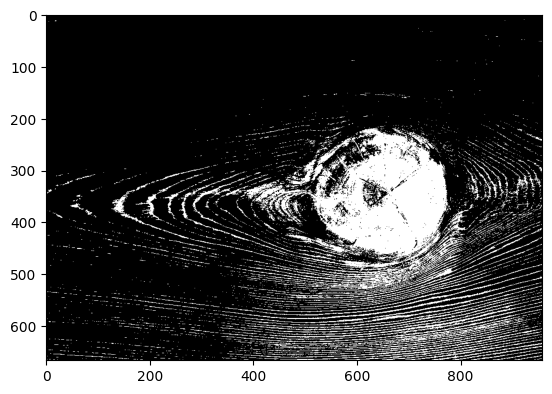

In [ ]:
# Conversion de l'image en niveau de gris après correction
gray_image = clr.rgb2gray(Gamma_corrected_image)
# Calcule du seuil par la méthode d'Otsu et seuillage de l'image
T_otsu = threshold_otsu(gray_image)
image_thresholded_Otsu = gray_image < T_otsu
plt.imshow(image_thresholded_Otsu, cmap='gray')

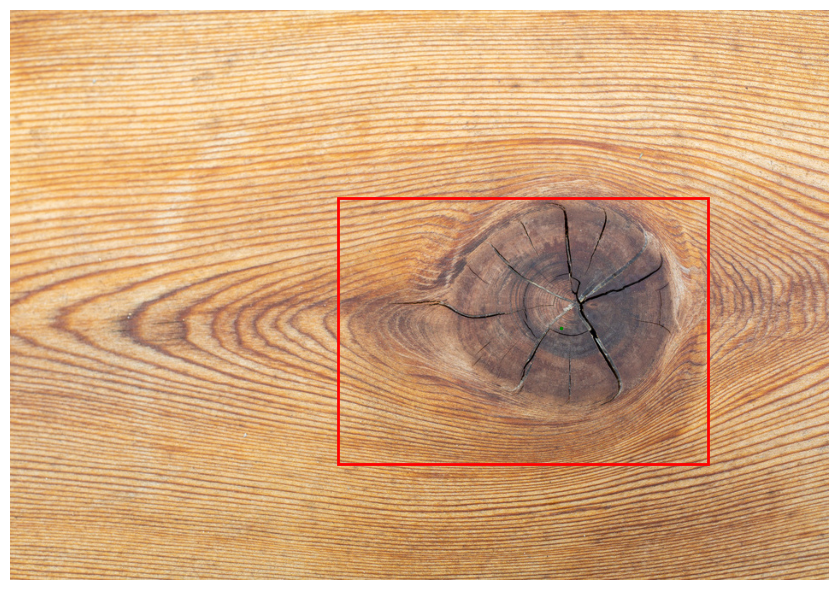

In [ ]:
label_image1 = skimage.measure.label(image_thresholded_Otsu )
regions1 = skimage.measure.regionprops(label_image1)

# On récupère les aires des régions dont l'excentricité est inférieure à 0,9, pour qu'ensuite trouver l'aire maximale .
Aires = [ region.area for region in regions1 if (region.eccentricity < 0.9)]
max_aire = np.max(Aires)
filtered_regions3 = [region for region in regions1 if  (region.area_filled > 0.05*max_aire) & (region.eccentricity < 0.9)]
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image, cmap= 'gray')

for region in filtered_regions3:

    min_row, min_colon, max_row, max_colon = region.bbox
    rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                    fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)
    ax.plot()
    y0, x0 = region.centroid
    ax.plot(x0, y0, '.g', markersize=3)

ax.set_axis_off()
plt.tight_layout()
plt.show()

# Discution des résultats obtenus

**MULTI OTSU**

Une caractéristique constatée sur les images du dataset est que, même si les parties environnantes d'un noeud sont sombres, leurs intensités sont généralement légèrement inférieures à celle des noeuds. C'est pour cela que, pour mieux distinguer les noeuds des autres parties sombres, nous avons pensé à calculer deux seuils au lieu d'un seul. Nous utilisons donc la **méthode d'Otsu à multi-seuils**.

In [43]:
image = io.imread(Liste_noms[0])
image1 = equalize_hist(image)*255
image1 = image1.astype(float)
# Application de la correction Gamma
gamma = 0.02
Gamma_corrected_image = np.array(255*(image1/255)**gamma, dtype = 'uint8')

gray_image = clr.rgb2gray(Gamma_corrected_image)
[T_otsu_1, T_otsu_2] = threshold_multiotsu(gray_image, classes = 3)


In [ ]:
T_otsu_1

0.9605705231311275

In [ ]:
T_otsu_2

0.982195063572304

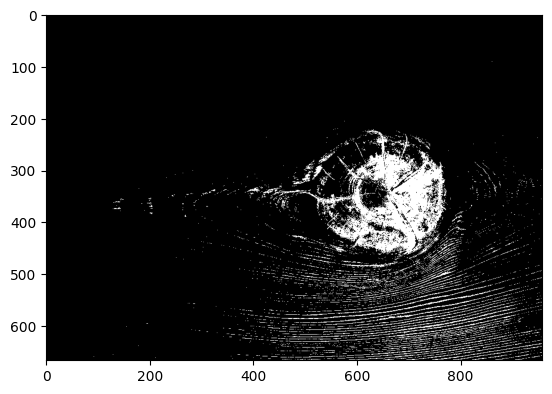

In [44]:
image_thresholded_Otsu = gray_image < T_otsu_1
plt.imshow(image_thresholded_Otsu, cmap='gray')

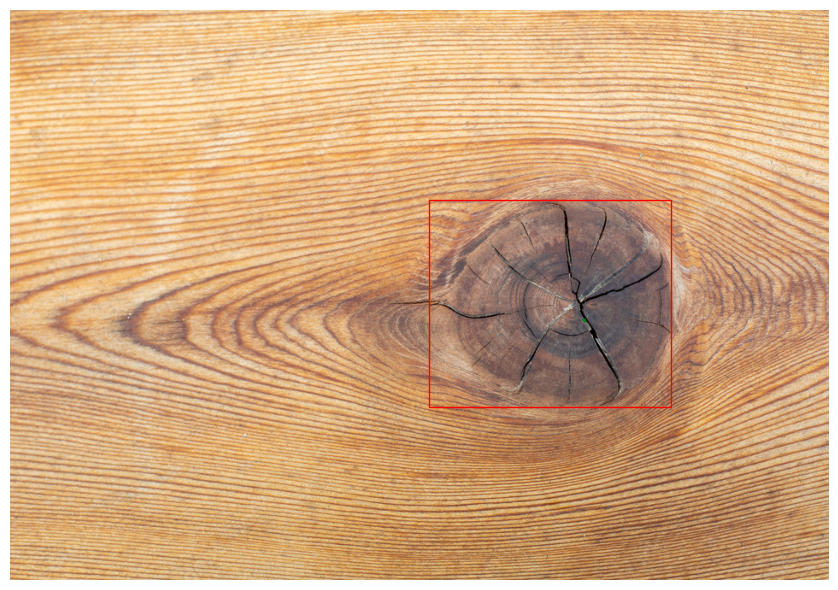

In [45]:

label_image1 = skimage.measure.label(image_thresholded_Otsu)
regions1 = skimage.measure.regionprops(label_image1)

# On récupère les aires des régions dont l'excentricité est inférieure à 0,9, pour qu'ensuite trouver l'aire maximale .
Aires = [ region.area for region in regions1 if (region.eccentricity < 0.9)]
max_aire = np.max(Aires)
filtered_regions3 = [region for region in regions1 if  (region.area_filled > 0.01*max_aire) & (region.eccentricity < 0.9)]
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image, cmap= 'gray')

for region in filtered_regions3:

    min_row, min_colon, max_row, max_colon = region.bbox
    rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                    fill=False, edgecolor='red', linewidth=1)
    ax.add_patch(rect)
    ax.plot()
    y0, x0 = region.centroid
    ax.plot(x0, y0, '.g', markersize=3)

ax.set_axis_off()
plt.tight_layout()
plt.show()

**Ecriture de l'approche finale en une fonction**



In [37]:
def methode_finale(path_image):
  #path_image = os.path.join(Path,image)
  image = io.imread(path_image)
  image1 = equalize_hist(image)*255
  image1 = image1.astype(float)
  # Application de la correction Gamma
  gamma = 0.02
  Gamma_corrected_image = np.array(255*(image1/255)**gamma, dtype = 'uint8')

  gray_image = clr.rgb2gray(Gamma_corrected_image)
  [T_otsu_1, T_otsu_2] = threshold_multiotsu(gray_image, classes = 3)
  image_thresholded_Otsu = gray_image < T_otsu_1
  label_image1 = skimage.measure.label(image_thresholded_Otsu)
  regions1 = skimage.measure.regionprops(label_image1)

  # On récupère les aires des régions dont l'excentricité est inférieure à 0,9, pour qu'ensuite trouver l'aire maximale .
  Aires = [ region.area for region in regions1 if (region.eccentricity < 0.9)]
  max_aire = np.max(Aires)
  filtered_regions3 = [region for region in regions1 if  (region.area_filled > 0.01*max_aire) & (region.eccentricity < 0.9)]
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.imshow(image, cmap= 'gray')

  for region in filtered_regions3:

      min_row, min_colon, max_row, max_colon = region.bbox
      rect = mpatches.Rectangle((min_colon, min_row), max_colon - min_colon, max_row - min_row,
                                      fill=False, edgecolor='red', linewidth=1)
      ax.add_patch(rect)
      ax.plot()
      y0, x0 = region.centroid
      ax.plot(x0, y0, '.g', markersize=3)

  ax.set_axis_off()
  plt.tight_layout()
  plt.show()

**Resultats sur tout le Dataset**

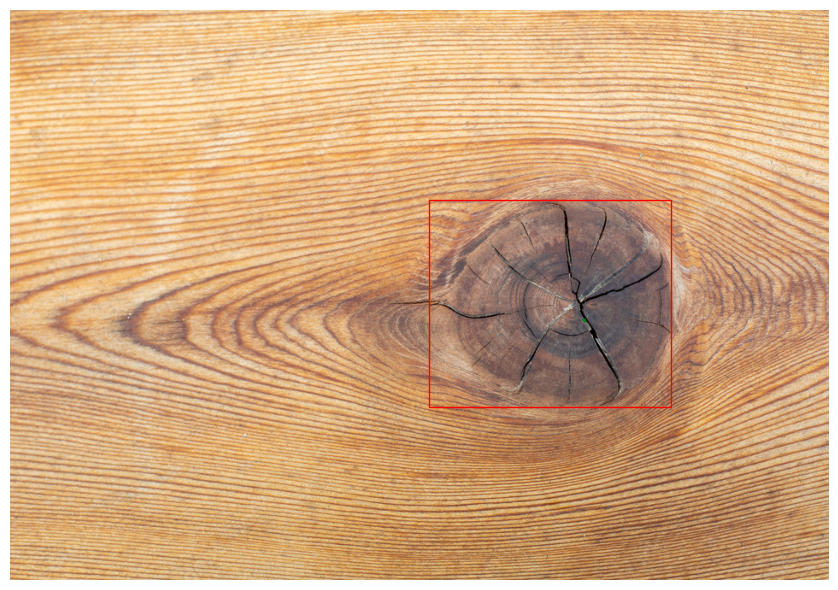

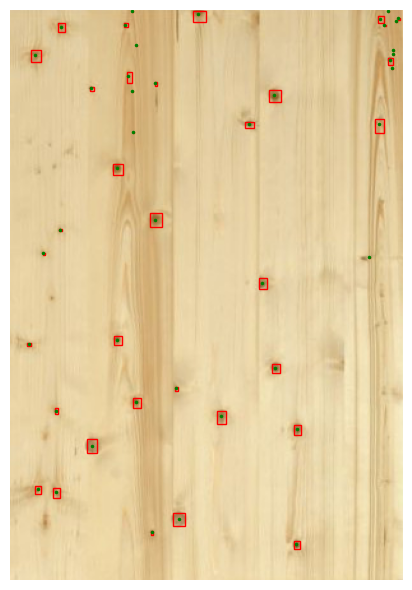

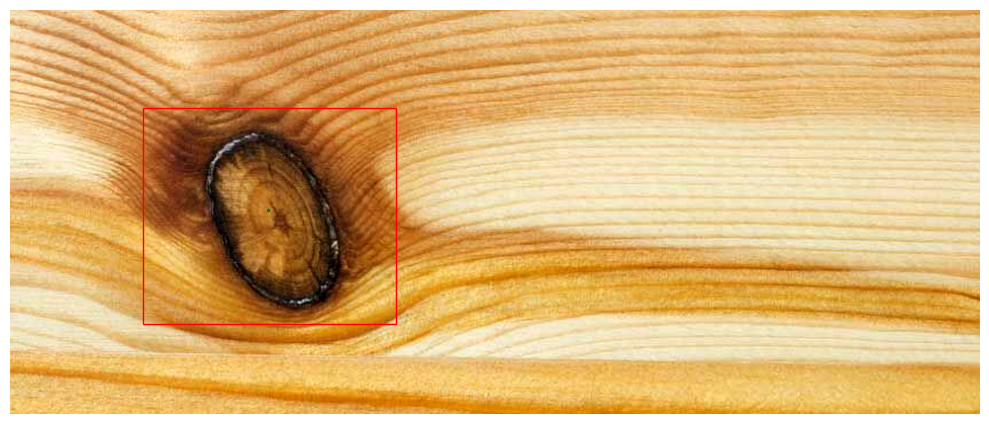

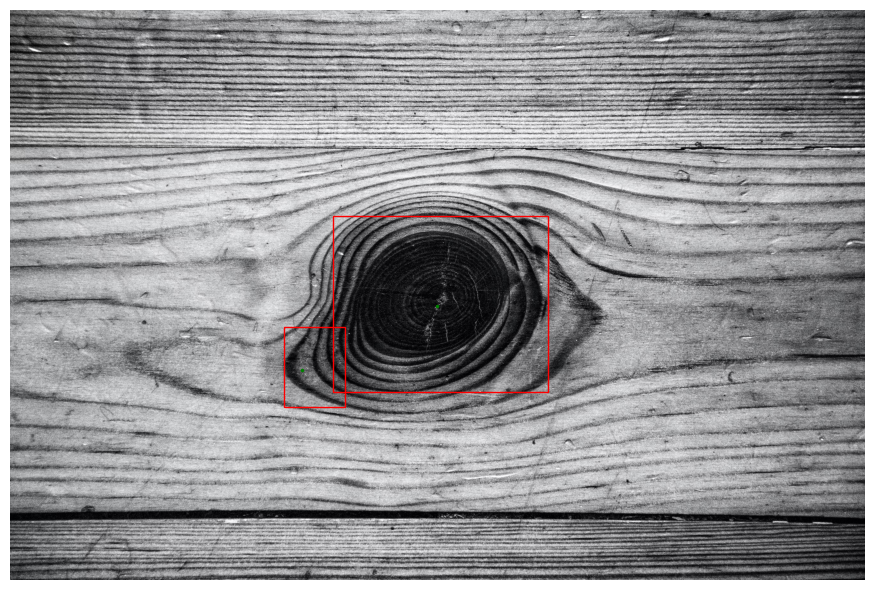

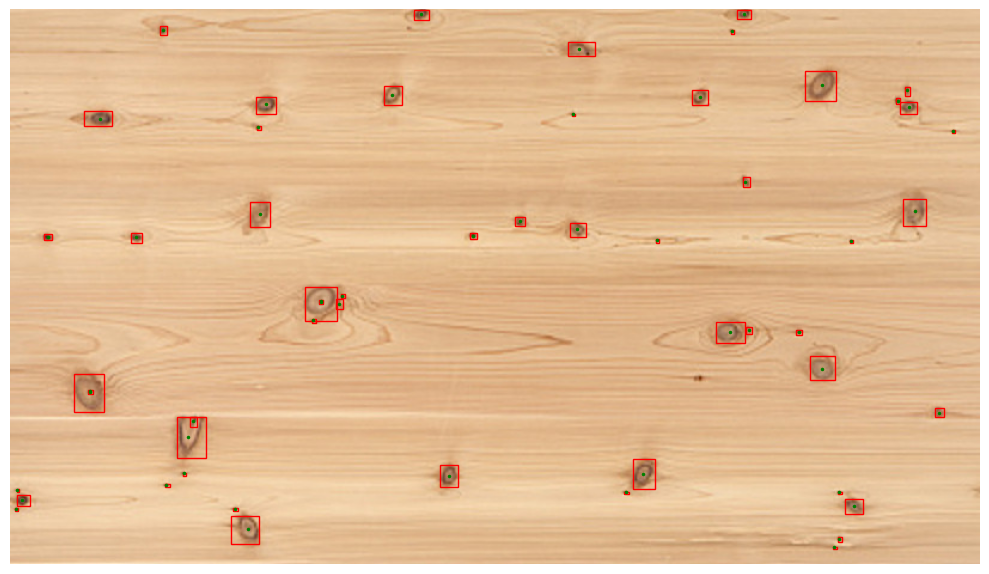

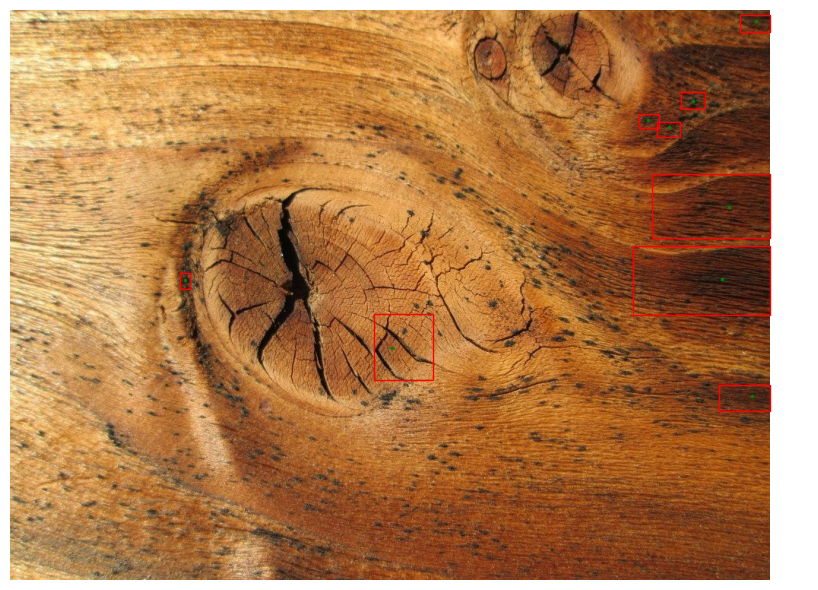

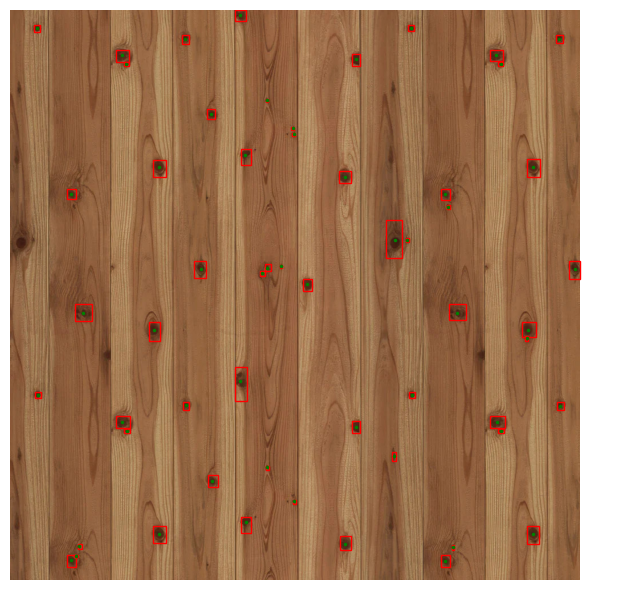

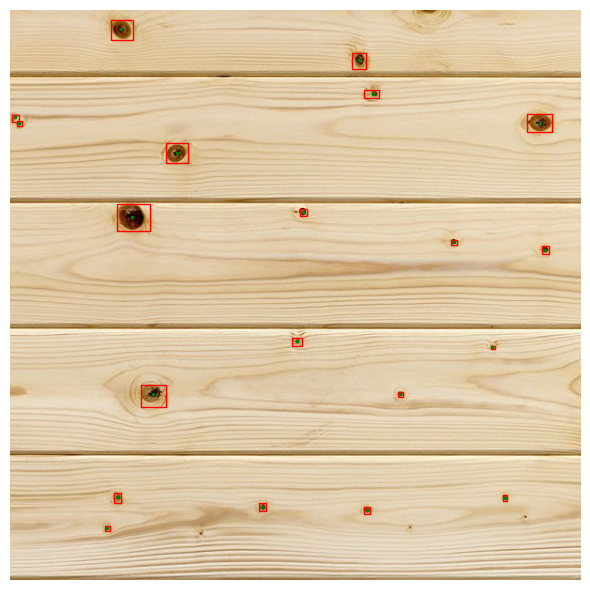

In [38]:
for path in Liste_noms:
  methode_finale(path)

**Et si on ajoutait une dilatation pour augmenter la surface des petites surfaces détectées et une érosion pour séparer les noeuds des pixels qui ne correspondent pas à des noeuds ?**

 # **Conclusion**

 La problématique posée dans ce projet est la détection précise des nœuds dans des échantillons de bois, étant donné leur impact sur la structure et l'esthétique du matériau. Pour répondre à cette problématique, une méthode initiale de détection des nœuds a été mise en œuvre et évaluée sur un jeu de données spécifiques.

 Cette méthode initiale a permis une première analyse des résultats, mettant en lumière ses forces et ses limitations. Des améliorations ont été suggérées pour rendre la détection plus objectives en automatisant les seuils et les critères de surface minimale des nœuds, tout en tenant compte des particularités de chaque image.

l'introduction d'une transformation d'histogramme a également été envisagée pour ameliorer la précision de la détection, en mettant en évidence les zones sombres correspondant aux nœuds dans les images.

Les résultats obtenus ont montré des avancées significatices dans la détection des nœuds, notamment avec l'amélioration des critères de seuil et de surface minimale. Cependant, des limitations persistent, notamment en termes de variation d'éclairage ou de textures, qui pourraient nécessiter des ajustements supplémentaires pour une détection encore plus précise et robuste.

Pour les perspectives, il serait intéressant d'explorer des techniques avancées de traitement d'image, telles que l'apprentissage automatique, pour une détection plus sophistiquée des nœuds, prenant en compte une plus grande variété de caractéristiques visuelles. De plus, l'expansion du jeu de données et la validation sur des échantillons variés pourraient consolider la généralisation de cette méthode.

# **References**

[1] TODOROKI, C. L., LOWELL, Eini C., et DYKSTRA, Dennis. Automated knot detection with visual post-processing of Douglas-fir veneer images. Computers and electronics in agriculture, 2010, vol. 70, no 1, p. 163-171.

[2] HITTAWE, Mohamad Mazen, SIDIBÉ, Désiré, et MÉRIAUDEAU, Fabrice. Bag of words representation and SVM classifier for timber knots detection on color images. In : 2015 14th IAPR international conference on machine vision applications (MVA). IEEE, 2015. p. 287-290.